#### Lib ที่ใช้สำหรับรันชุด Code

In [ ]:
pip install numpy matplotlib ipython

#### Gradient Descent Code

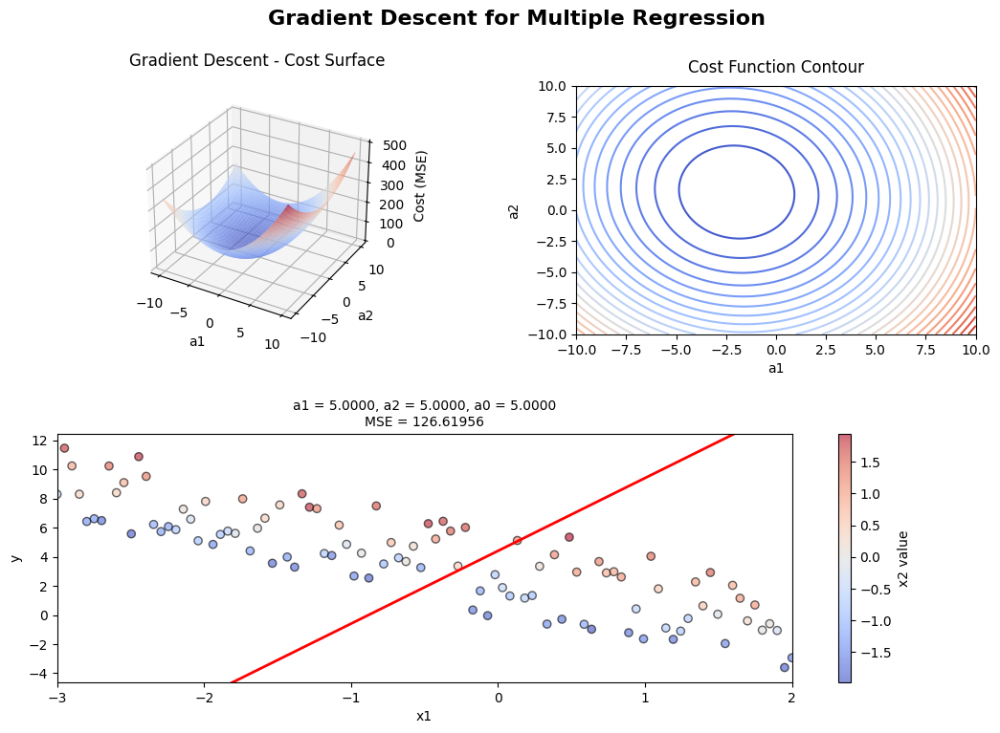

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation


np.random.seed(42)
x1 = np.linspace(-3, 2, 100)
x2 = np.random.uniform(-2, 2, 100)  
y = -2 * x1 + 1.5 * x2 + 3 + np.random.normal(0, 0.5, len(x1)) 

# ฟังก์ชันค่าเสียหาย (Mean Squared Error - MSE)
def compute_mse(a0, a1, a2, x1, x2, y):
    y_pred = a1 * x1 + a2 * x2 + a0
    return np.mean((y - y_pred) ** 2)

# ค่าพารามิเตอร์เริ่มต้น
a0, a1, a2 = 5, 5, 5  # ค่าเริ่มต้น
alpha = 0.1  # Learning rate
iterations = 50

a0_history, a1_history, a2_history, mse_history = [a0], [a1], [a2], [compute_mse(a0, a1, a2, x1, x2, y)]

# Gradient Descent ปรับค่า a0, a1 และ a2 ตามจำนวนรอบ
for _ in range(iterations):
    y_pred = a1 * x1 + a2 * x2 + a0
    da0 = -2 * np.mean(y - y_pred)
    da1 = -2 * np.mean(x1 * (y - y_pred))
    da2 = -2 * np.mean(x2 * (y - y_pred))
    a0 -= alpha * da0
    a1 -= alpha * da1
    a2 -= alpha * da2

    a0_history.append(a0)
    a1_history.append(a1)
    a2_history.append(a2)
    mse_history.append(compute_mse(a0, a1, a2, x1, x2, y))

# สร้างพื้นผิวของค่า Cost Function 
A1, A2 = np.meshgrid(np.linspace(-10, 10, 100), np.linspace(-10, 10, 100))
Z = np.array([[compute_mse(a0, a1, a2, x1, x2, y) for a1, a2 in zip(a1_row, a2_row)] for a1_row, a2_row in zip(A1, A2)])

fig = plt.figure(figsize=(12, 8))

# กราฟที่ 1: 3D Surface Plot ของค่า Cost
ax1 = fig.add_subplot(2, 2, 1, projection='3d')
ax1.plot_surface(A1, A2, Z, cmap='coolwarm', alpha=0.7)
sc1 = ax1.scatter([], [], [], c='black', marker='x', s=50)
ax1.set_xlabel("a1")
ax1.set_ylabel("a2")
ax1.set_zlabel("Cost (MSE)")
ax1.set_title("Gradient Descent - Cost Surface", fontsize=12, pad=15)

# กราฟที่ 2: Contour Plot ของค่า Cost
ax2 = fig.add_subplot(2, 2, 2)
contour = ax2.contour(A1, A2, Z, levels=30, cmap='coolwarm')
sc2 = ax2.scatter([], [], c='black', marker='x', s=50)
ax2.set_xlabel("a1")
ax2.set_ylabel("a2")
ax2.set_title("Cost Function Contour", fontsize=12, pad=10)

# กราฟที่ 3: Regression Line เทียบกับข้อมูลจริง
ax3 = fig.add_subplot(2, 1, 2)

# พล็อตจุดโดยใช้สีแสดงค่า x2
sc = ax3.scatter(x1, y, c=x2, cmap='coolwarm', edgecolor='k', alpha=0.6)

# เส้น Regression Line 
line, = ax3.plot([], [], 'r', lw=2)

cbar = fig.colorbar(sc, ax=ax3)
cbar.set_label("x2 value")

ax3.set_xlabel("x1")
ax3.set_ylabel("y")
ax3.set_xlim(-3, 2)
ax3.set_ylim(min(y)-1, max(y)+1)
ax3.set_title("Regression Line - Gradient Descent Updates", fontsize=12, pad=10)

def update(i):
    sc1._offsets3d = (np.array(a1_history[:i]), np.array(a2_history[:i]), np.array(mse_history[:i]))
    sc2.set_offsets(np.c_[a1_history[:i], a2_history[:i]])
    line.set_data(x1, a1_history[i] * x1 + a2_history[i] * np.mean(x2) + a0_history[i])
    ax3.set_title(f"a1 = {a1_history[i]:.4f}, a2 = {a2_history[i]:.4f}, a0 = {a0_history[i]:.4f}\nMSE = {mse_history[i]:.5f}", fontsize=10)
    return sc1, sc2, line

ani = animation.FuncAnimation(fig, update, frames=len(a0_history), interval=200, repeat=False)

plt.suptitle("Gradient Descent for Multiple Regression", fontsize=16, fontweight='bold')
plt.subplots_adjust(left=0.1, right=0.9, top=0.88, bottom=0.1, hspace=0.4, wspace=0.3)

from IPython.display import HTML
HTML(ani.to_jshtml())